# EDA - Predicting Zomato Restaurant Ratings

<b>GOAL OF CAPSTONE PROJECT:</b> PREDICT THE RATING OF A RESTAURANT.<BR>
<b>TARGET VARIABLE:</b> RATE

<b>Descriptions of columns:<b>
    
1. url - contains the url of the restaurant in the zomato website

2. address - contains the address of the restaurant in Bengaluru

3. name - contains the name of the restaurant

4. online_order-  whether online ordering is available in the restaurant or not

5. book_table - table book option available or not

6. rate - contains the overall rating of the restaurant out of 5

7. votes - contains total number of rating for the restaurant as of the above mentioned date

8. phone - contains the phone number of the restaurant

9. location - contains the neighborhood in which the restaurant is located

10. rest_type - restaurant type

11. dish_liked - dishes people liked in the restaurant

12. cuisines - food styles, separated by comma

13. approx_cost(for two people) - contains the approximate cost of meal for two people

14. reviews_list - list of tuples containing reviews for the restaurant, each tuple

15. menu_item - contains list of menus available in the restaurant

16. listed_in(type) - type of meal

17. listed_in(city) - contains the neighborhood in which the restaurant is listed
<br>
Link to download the DataSet : https://drive.google.com/file/d/1Uj_70Gp0chnjkkrIysD4U75CcfL1UpPg/view?usp=sharing

***

# START PROJECT

IMPORT DEPENDENCIES:

In [245]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
import plotly.express as px
import re # (use regular expression to split words)
import statistics # Import the statistics module

import matplotlib.ticker as mtick
plt.style.use('fivethirtyeight')

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

LOAD DATA:

In [246]:
data = pd.read_csv('zomato.csv/zomato.csv')

VIEW OF DATASET:

In [247]:
# View first five entries of the dataset:
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


# EXPLORATORY DATA ANALYSIS (EDA):

In [248]:
# Observe number of rows(entires) and columns of datset:
print(data.shape)

print('Rows(entires): 51717','Features: 17')

(51717, 17)
Rows(entires): 51717 Features: 17


In [249]:
# Observe datatypes:
data.dtypes

# 'votes' is integer(int64), while the rest is 'object'

url                            object
address                        object
name                           object
online_order                   object
book_table                     object
rate                           object
votes                           int64
phone                          object
location                       object
rest_type                      object
dish_liked                     object
cuisines                       object
approx_cost(for two people)    object
reviews_list                   object
menu_item                      object
listed_in(type)                object
listed_in(city)                object
dtype: object

In [250]:
# Check null values:
data.isna().sum()

# Observation:
#Features that have null values:
# rate, phone, location, rest_type, dish_liked, cuisines, approx_cost(for two people).

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [251]:
# Delete columns that are not needed, and assign the remaining columns to a new variable(container):
df = data.drop(['url','phone'], axis=1)

In [252]:
# Check dataframe:
df

,address,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,Whitefield,Bar,NaN,Continental,"1,500","[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,600,[],[],Pubs and bars,Whitefield
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,"2,000",[],[],Pubs and bars,Whitefield
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


In [253]:
# Check the remaining columns of dataset, by veiwing it as a dataframe:
pd.DataFrame(df.columns)

,0
0,address
1,name
2,online_order
3,book_table
4,rate
5,votes
6,location
7,rest_type
8,dish_liked
9,cuisines


In [254]:
# Check duplicate values in dataframe:
df.duplicated().sum()

# Data has 43 duplicates.

43

In [255]:
# Drop duplicate values:
df.drop_duplicates(inplace=True)

In [256]:
# Check again if there are any in dataframe:
df.duplicated().sum()

# No more duplicate values.

0

***

DROP NULL(NAN) VALUES:

In [257]:
# Drop Null(NaN) values: Remove NAN values in dataset.
df.dropna(how='any', inplace=True)

# Check if there are still any null(NAN) values in the dataset:
df.isnull().sum()

# No more null(NAN) values in dataset.

address                        0
name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
location                       0
rest_type                      0
dish_liked                     0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
menu_item                      0
listed_in(type)                0
listed_in(city)                0
dtype: int64

RENAME COLUMNS APPROPRIATELY:

In [258]:
# Check columns to see if there are columns that are needed to be simplified to have it make more sense:
df.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [259]:
# Rename/improve/simplify some of the column names:
df = df.rename(columns = {'approx_cost(for two people)':'cost','listed_in(type)':'type', 'listed_in(city)':'city'})

# 'approx_cost(for two people)' is too long, so rename to 'cost'.
# 'listed_in(type)' is too long, so rename to 'type'.
# 'listed_in(city)' is too long, so rename to 'city'.

# Check improved column names in dataframe:
df.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

In [260]:
# Veiw it as a dataframe(the changes made in the column names look clearer):
pd.DataFrame(df.columns)

,0
0,address
1,name
2,online_order
3,book_table
4,rate
5,votes
6,location
7,rest_type
8,dish_liked
9,cuisines


In [261]:
# Check dataframe:
df.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


CLEAN DATASET:

In [262]:
# Observe unique values in 'cost' column:
df['cost'].unique()

# Observation: all values data types are 'object', all numbers are in between single quotes('').
# Some numbers have commas( ex: 2,200', '2,000', '1,800').
# The comma(') present in some values needed to be deleted.
# The values, from 'string' datatype, needed to be changed to 'float' data type.

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '750', '200', '850', '1,200', '150', '350', '250', '1,500',
       '1,300', '1,000', '100', '900', '1,100', '1,600', '950', '230',
       '1,700', '1,400', '1,350', '2,200', '2,000', '1,800', '1,900',
       '180', '330', '2,500', '2,100', '3,000', '2,800', '3,400', '40',
       '1,250', '3,500', '4,000', '2,400', '1,450', '3,200', '6,000',
       '1,050', '4,100', '2,300', '120', '2,600', '5,000', '3,700',
       '1,650', '2,700', '4,500'], dtype=object)

In [263]:
# Replace coma(,) "," with no space, and convert the 'string' type results into 'flaot' data type:
# Use lambda function to replace coma(',') in the values, in 'cost' column.
df['cost'] = df['cost'].apply(lambda x: x.replace(',', ''))

# Convert results into 'flaot' data type.
df['cost'] = df['cost'].astype(float)

In [264]:
# Check values in 'cost' column:
print(df['cost'].unique())
print("Data type of 'cost' column ➔", df['cost'].dtype)
# Each number has no more coma. Data type of numbers changed into 'float' datatype.

print('---'*20)
# Check dataframe data types:
df.dtypes

[ 800.  300.  600.  700.  550.  500.  450.  650.  400.  750.  200.  850.
 1200.  150.  350.  250. 1500. 1300. 1000.  100.  900. 1100. 1600.  950.
  230. 1700. 1400. 1350. 2200. 2000. 1800. 1900.  180.  330. 2500. 2100.
 3000. 2800. 3400.   40. 1250. 3500. 4000. 2400. 1450. 3200. 6000. 1050.
 4100. 2300.  120. 2600. 5000. 3700. 1650. 2700. 4500.]
Data type of 'cost' column ➔ float64
------------------------------------------------------------


address          object
name             object
online_order     object
book_table       object
rate             object
votes             int64
location         object
rest_type        object
dish_liked       object
cuisines         object
cost            float64
reviews_list     object
menu_item        object
type             object
city             object
dtype: object

In [265]:
# Observe unique values in 'rate' column:
df['rate'].unique()

# Column 'rate' has a rating value range of 0-5. One value is 'NEW'. Values have '/5'.
# Delete 'NEW', '/5'.

array(['4.1/5', '3.8/5', '3.7/5', '4.6/5', '4.0/5', '4.2/5', '3.9/5',
       '3.0/5', '3.6/5', '2.8/5', '4.4/5', '3.1/5', '4.3/5', '2.6/5',
       '3.3/5', '3.5/5', '3.8 /5', '3.2/5', '4.5/5', '2.5/5', '2.9/5',
       '3.4/5', '2.7/5', '4.7/5', 'NEW', '2.4/5', '2.2/5', '2.3/5',
       '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5', '4.1 /5', '2.9 /5',
       '2.7 /5', '2.5 /5', '2.6 /5', '4.5 /5', '4.3 /5', '3.7 /5',
       '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '3.4 /5', '3.6 /5',
       '3.3 /5', '4.6 /5', '4.9 /5', '3.2 /5', '3.0 /5', '2.8 /5',
       '3.5 /5', '3.1 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [266]:
# Delete "NEW". Use boolean != (not equal) as condition.
df = df.loc[df.rate !='NEW']
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '4.6/5', '4.0/5', '4.2/5', '3.9/5',
       '3.0/5', '3.6/5', '2.8/5', '4.4/5', '3.1/5', '4.3/5', '2.6/5',
       '3.3/5', '3.5/5', '3.8 /5', '3.2/5', '4.5/5', '2.5/5', '2.9/5',
       '3.4/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5', '4.8/5',
       '3.9 /5', '4.2 /5', '4.0 /5', '4.1 /5', '2.9 /5', '2.7 /5',
       '2.5 /5', '2.6 /5', '4.5 /5', '4.3 /5', '3.7 /5', '4.4 /5',
       '4.9/5', '2.1/5', '2.0/5', '1.8/5', '3.4 /5', '3.6 /5', '3.3 /5',
       '4.6 /5', '4.9 /5', '3.2 /5', '3.0 /5', '2.8 /5', '3.5 /5',
       '3.1 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5', '2.1 /5',
       '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [267]:
# Delete '/5' in each value in column 'rate'. Use lambda and replace function in removing '/5', with no space.
df['rate'] = df['rate'].apply(lambda x: x.replace('/5', ''))

In [268]:
# Check unique values in 'rate column':
df['rate'].unique()

# '/5' has been deleted.

array(['4.1', '3.8', '3.7', '4.6', '4.0', '4.2', '3.9', '3.0', '3.6',
       '2.8', '4.4', '3.1', '4.3', '2.6', '3.3', '3.5', '3.8 ', '3.2',
       '4.5', '2.5', '2.9', '3.4', '2.7', '4.7', '2.4', '2.2', '2.3',
       '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ', '2.9 ', '2.7 ', '2.5 ',
       '2.6 ', '4.5 ', '4.3 ', '3.7 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '3.4 ', '3.6 ', '3.3 ', '4.6 ', '4.9 ', '3.2 ', '3.0 ', '2.8 ',
       '3.5 ', '3.1 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ', '2.2 ',
       '2.0 ', '1.8 '], dtype=object)

In [269]:
# Check 'rate ' column:
df['rate']

0         4.1
1         4.1
2         3.8
3         3.7
4         3.8
         ... 
51705    3.8 
51707    3.9 
51708    2.8 
51711    2.5 
51715    4.3 
Name: rate, Length: 23248, dtype: object

In [270]:
# Check ddata types of dataframe:
df.dtypes

address          object
name             object
online_order     object
book_table       object
rate             object
votes             int64
location         object
rest_type        object
dish_liked       object
cuisines         object
cost            float64
reviews_list     object
menu_item        object
type             object
city             object
dtype: object

***

## ANALYZE TARGET VARIABLE: 

In [271]:
# Change order of columns:
df = df[['name','address','rate', 'votes','cost','online_order', 'book_table','dish_liked', 'cuisines','location','rest_type',
         'reviews_list', 'menu_item', 'type', 'city']]

In [272]:
df.head(2)

,name,address,rate,votes,cost,online_order,book_table,dish_liked,cuisines,location,rest_type,reviews_list,menu_item,type,city
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,Spice Elephant,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",4.1,787,800.0,Yes,No,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari


#### SINCE THE TARGET VARIABLE IS 'RATE', ANALYZE AND OBSERVE 'RATE' COLUMN:

In [273]:
# Observe unique values in 'rate' column:
df['rate'].unique()

# The data type of the unique values in 'rate' column is a 'string'. Therefore the data type needs to be converted into 'float'.

array(['4.1', '3.8', '3.7', '4.6', '4.0', '4.2', '3.9', '3.0', '3.6',
       '2.8', '4.4', '3.1', '4.3', '2.6', '3.3', '3.5', '3.8 ', '3.2',
       '4.5', '2.5', '2.9', '3.4', '2.7', '4.7', '2.4', '2.2', '2.3',
       '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ', '2.9 ', '2.7 ', '2.5 ',
       '2.6 ', '4.5 ', '4.3 ', '3.7 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '3.4 ', '3.6 ', '3.3 ', '4.6 ', '4.9 ', '3.2 ', '3.0 ', '2.8 ',
       '3.5 ', '3.1 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ', '2.2 ',
       '2.0 ', '1.8 '], dtype=object)

In [274]:
# Convert 'rate' column data type fromstring into float.
df['rate'] = df['rate'].astype(float)

In [275]:
df['rate']

0        4.1
1        4.1
2        3.8
3        3.7
4        3.8
        ... 
51705    3.8
51707    3.9
51708    2.8
51711    2.5
51715    4.3
Name: rate, Length: 23248, dtype: float64

In [276]:
# Observe minimum rating for a restaurant in 'rate' column:
df['rate'].min()

1.8

In [277]:
# Observe maximum rating for a restaurant in 'rate' column:
df['rate'].max()

4.9

In [278]:
# Find the number of restaurants that have ratings from range 1-2,2-3,3-4:
# Calculate how many restaurants have ratings between 1 and less than 2 (1 to approximately 1.8).
((df['rate']>=1) & (df['rate']<2)).sum()

# Result: total number of restaurants with ratings between 1 and less than 2: 5

5

In [279]:
# Calculate how many restaurants have ratings between 2 and less than 3.
((df['rate']>=2) & (df['rate']<3)).sum()

# Result: total number of restaurants with ratings between 2 and less than 3: 1179

1179

In [280]:
# Calculate how many restaurants have ratings between 3 and less than 4.
((df['rate']>=3) & (df['rate']<4)).sum()

# Result: total number of restaurants with ratings between 3 and less than 4: 10153

10153

In [281]:
# Calculate how many restaurants have ratings from 4 and up to 5, since 5 is the maximum rating.
(df['rate']>=4).sum()

# Result: total number of restaurants with ratings from 4 and up to 5: 11911

11911

CHECK CORRELATION SCORES OF COLUMNS WITH NUMERIC VALUES IN DATASET:

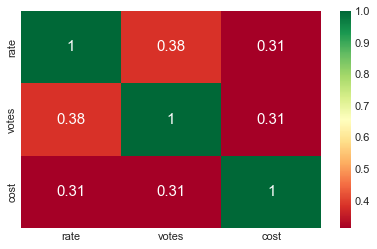

In [282]:
# Check correlation scores of columns with numeric values in dataset:
sns.heatmap(df.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})
plt.show()

OBSERVE THE DISTRIBUTION OF RESTAURANT RATINGS:

<AxesSubplot:xlabel='rate', ylabel='Density'>

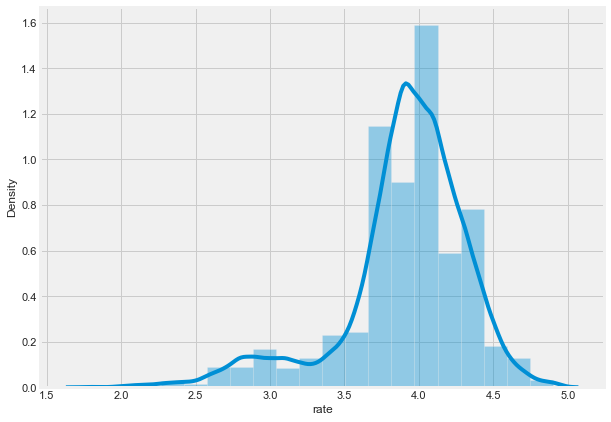

In [283]:
# Plot to observe the distribution of restaurant ratings:
plt.figure(figsize=(9,7))
sns.distplot(df['rate'],bins=20)

# Observation: Majority of the ratings are between the range of 3.5 and 4.5

Mean of Rating Category : 3.905781142463868


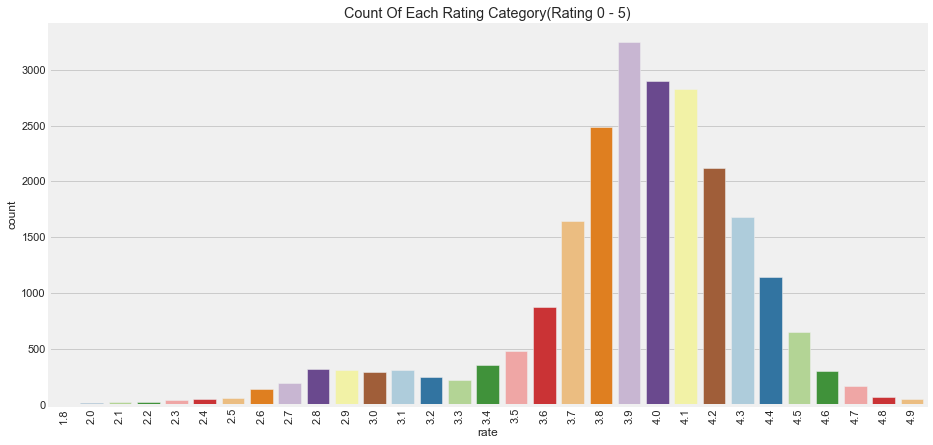

In [284]:
# Check count of each rating category in dataset:
# Print mean of dataset:

mean_df = statistics.mean(df['rate'])
print("Mean of Rating Category :", mean_df)

# Plot count of 'rate' category:
plt.rcParams['figure.figsize'] = 14,7
sns.countplot(df['rate'], palette='Paired')
plt.title("Count Of Each Rating Category(Rating 0 - 5)")
plt.xticks(rotation = 90)
plt.show()

# Observation: Majority of the restaurant rating: 3.5 - 4.5.
# Very few restaurants have rating 4.8.
# Distribution nearly follows normal distribution with a mean equal to 3.9

In [285]:
# Plot using pie chart: Observe number of restaurants that have:
# 'Low Ratings: 1 - 2','Medium Ratings: 2 - 3','High Ratings: 3 - 4','Higher Ratings: 4 - 5'

r_low = ((df['rate']>=1) & (df['rate']<2)).sum(); r_med = ((df['rate']>=2) & (df['rate']<3)).sum();
r_high = ((df['rate']>=3) & (df['rate']<4)).sum(); r_superhigh = (df['rate']>=4).sum()

range_of_ratings = [r_low, r_med, r_high, r_superhigh]
r_names=['Low Ratings: 1 - 2','Medium Ratings: 2 - 3','High Ratings: 3 - 4','Higher Ratings: 4 - 5']

# Create Hover Information: I’m going to create a string variable. I should format with %{parameter} style.
hovertemp = "<b>Rating Level: </b> %{label} <br>"
hovertemp += "<b>Number Of Restaurants: </b> %{value}"

# Plot pie chart:
fig = px.pie(data_frame=df, values=range_of_ratings, names=r_names, title='Ratings of Restaurants', width=800, height=700)

# Use update_traces method for applying this template.
fig.update_traces(hovertemplate=hovertemp)

fig.show()

# Alt code:
# range_of_ratings=[((df['rate']>=1) & (df['rate']<2)).sum(),((df['rate']>=2) & (df['rate']<3)).sum(),
#                   ((df['rate']>=3) & (df['rate']<4)).sum(),(df['rate']>=4).sum()]

COST:

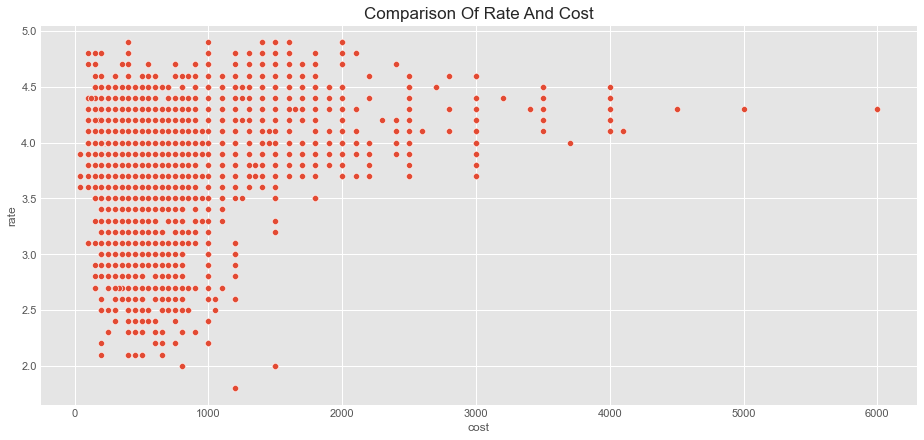

In [286]:
#plt.title('Comparison Of Rate, Votes And Cost')
plt.style.use(['ggplot'])
sns.scatterplot(x='cost', y='rate', data=df, palette='bright')

plt.title('Comparison Of Rate And Cost', fontsize=17)
plt.show()

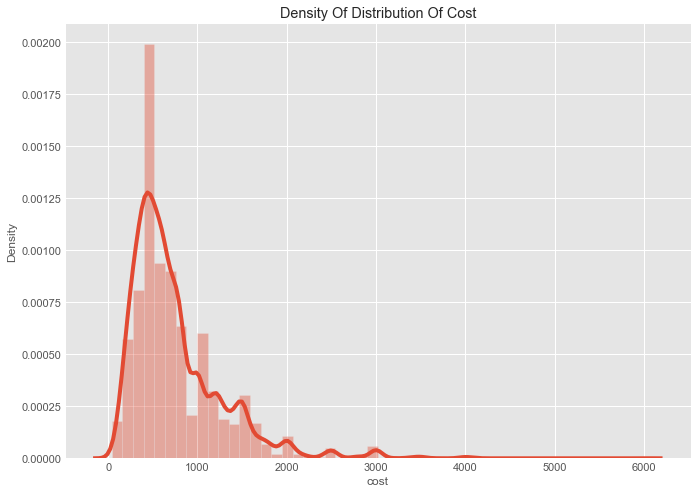

In [287]:
# Distribution of Cost of Food for two People: Detect outliers, observe minimum, median, and maximum costs.
# Create Boxplot data of distrubution of Cost.
dist_cost=go.Box(y=df['cost'], marker = dict(color = 'brown'))
costdat=[dist_cost] # assign dist_cost data to container (variable).

# Create layout.
layout_cost=go.Layout(yaxis=dict(title='Price of food'),width=800,height=800,
                 title='Distribution Of, Approximate Cost Of Food, For Two People')

# Plot distribution of Cost.
fig=go.Figure(data=costdat,layout=layout_cost)
py.iplot(fig)

# Observation:
# Mininmum cost of food: 40
# Median cost of food: 800
# Maximum cost of food: 6000
# Above the maximum cost are outliers, which has a maximum of: 6000

# Plot distribution of cost: Observe density of distribution of cost.
plt.figure(figsize=(10,8))
sns.distplot(df['cost'])
plt.title('Density Of Distribution Of Cost')
plt.show()

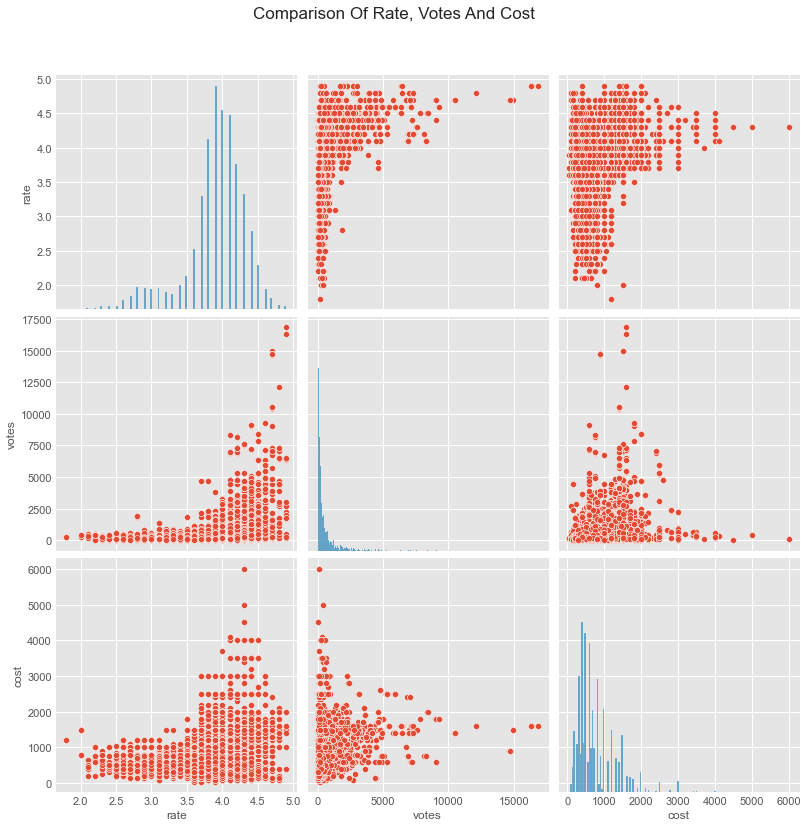

In [288]:
# Compare target variables 'rate','votes', and 'cost' see if there is any relationship between these two variables:
# Plot Comparison Of Rate, Votes And Cost:
ratecordf = df[['rate', 'votes', 'cost']]
plt.style.use(['ggplot'])

p = sns.pairplot(data=ratecordf)

# Set plot figure and size:
p.fig.set_size_inches(12,12)
plt.subplots_adjust(top=0.9)
p.fig.suptitle('Comparison Of Rate, Votes And Cost', fontsize=17)
plt.show()

<Figure size 720x1080 with 0 Axes>

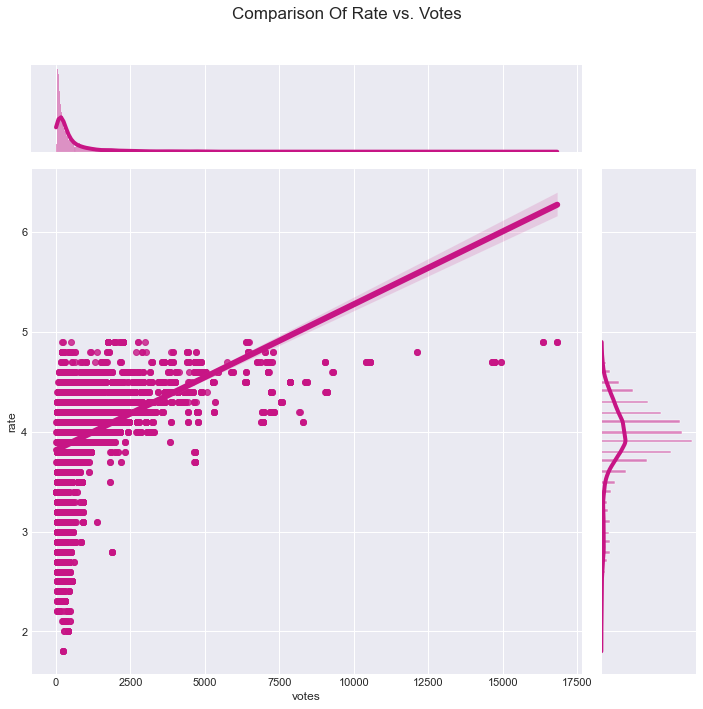

In [289]:
# Compare target variables 'rate' with 'votes' see if there is any relationship between these two variables.
# Set plot figure and size:
plt.figure(figsize=(10,15))
sns.set_style("darkgrid")

# Plot jointplot of variables 'rate' with 'votes':
p = sns.jointplot(x = 'votes', y = 'rate', data=df, kind = 'reg', height = 10, color='mediumvioletred')
plt.subplots_adjust(top=0.9)
p.fig.suptitle("Comparison Of Rate vs. Votes", fontsize=17)
plt.show()

# Observation: The number of votes correlate positively with level of rating. 
# Restaurants with more votes, have higher number of rating.

***
## ANALYZE OTHER VARIABLES:

OFFER ONLINE DELIVERY:

No. of restaurants with online delivery: 16378
No. of restaurants which does not deliver online: 6870
----------------------------------------------------------------------------------------------------


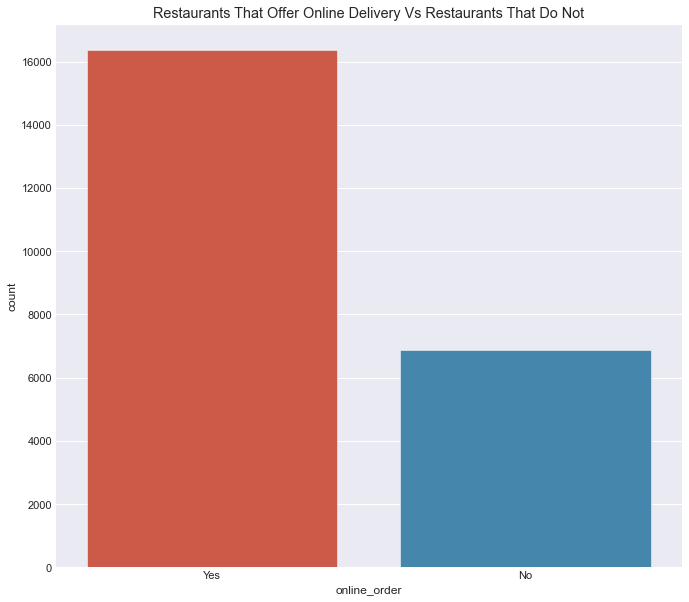

In [290]:
print("No. of restaurants with online delivery:",(df.online_order == 'Yes').sum())
print("No. of restaurants which does not deliver online:",(df.online_order == 'No').sum())
print('-----'*20)

# Plot to observe restaurants that offer online delivery or not:
# Restaurants that offer online delivery vs restaurants that do not.
sns.countplot(df['online_order'])
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Restaurants That Offer Online Delivery Vs Restaurants That Do Not')
plt.show()

# Observation: There are more restaurants that offer online delivery service.
# Restaurants that offer online delivery(yes): over 16000
# Restaurants that do not offer online delivery(no): between 6000-7000

Text(0.5, 1.0, 'Type Of Restaurants Delivering Online Or Not')

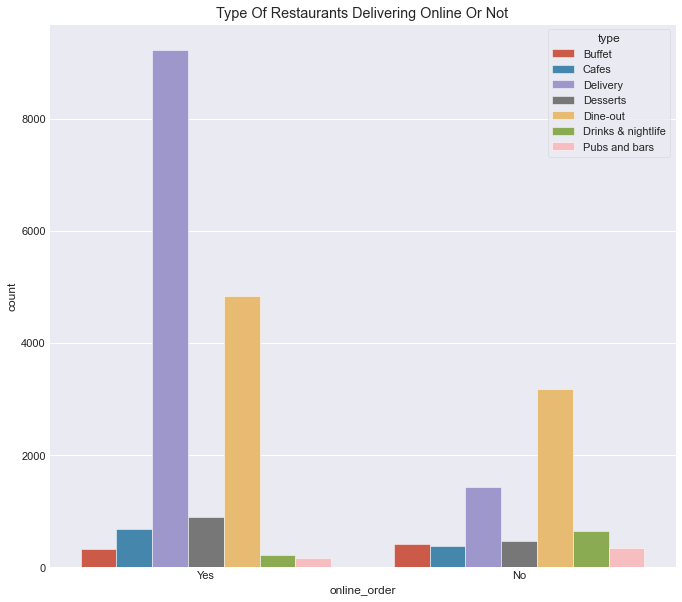

In [291]:
#Type of Restaurants delivering online or Not
sns.countplot(x=df['online_order'], hue = df['type'])
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Type Of Restaurants Delivering Online Or Not')

TABLE BOOKINGS:

In [292]:
# Plot to observe restaurants that offer table booking or not:
# Observe the ratio of 'Yes' over 'No'.
x=df['book_table'].value_counts()
colors = ['red', 'greed']

# Use Plotly
trace=go.Pie(labels=x.index,values=x,textinfo="value", marker=dict(colors=colors, line=dict(color='black', width=2)))

layout=go.Layout(title="Table Booking",width=600,height=600)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

# Observation:
# Yes: %26.1, No: %73.9
# Majority of restaurants in Bangalore, do not offer table booking.

Text(0.5, 1.0, 'Type Of Restaurants Providing Table Booking Facility:')

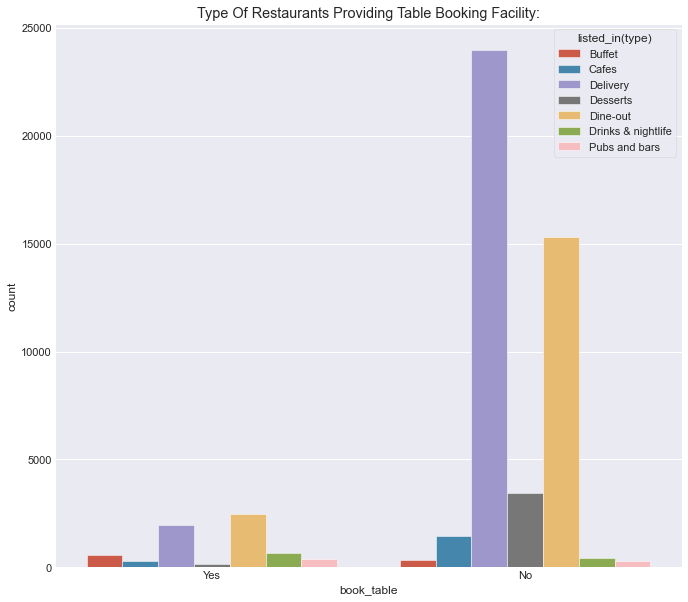

In [293]:
sns.countplot(x=data['book_table'],hue = data['listed_in(type)'])
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Type Of Restaurants Providing Table Booking Facility:')

MOST LIKED DISHES:

In [294]:
# Create Ranking of most liked dishes. Use for loop in 'dish_liked' column:
df.index=range(df.shape[0])
dishes_rank=[] # Create empty list of rank of liked dishes.
for i in range(df.shape[0]):
    array_split=re.split(',',df['dish_liked'][i])
    for item in array_split:
        dishes_rank.append(item) # append item to empty list 'dishes_rank'.

# Inspect 'dish_liked' column to observe and rank most liked dishes.
most_liked_dishes = pd.Series(dishes_rank).value_counts()
print("Ranking of most liked dishes of the restaurants according to number of orders:")
most_liked_dishes.head()

Ranking of most liked dishes of the restaurants according to number of orders:


 Pasta        2692
 Pizza        1915
 Cocktails    1880
 Burgers      1736
 Mocktails    1623
dtype: int64

In [295]:
# Has multi-values:
df['cuisines'].value_counts()

North Indian                                                  1152
North Indian, Chinese                                          778
South Indian                                                   366
Cafe                                                           285
South Indian, North Indian, Chinese                            233
                                                              ... 
North Indian, South Indian, Chinese, Desserts, Street Food       1
Biryani, North Indian, Rolls                                     1
Ice Cream, Desserts, Juices                                      1
North Indian, Chinese, South Indian, Juices                      1
Thai, Chinese, Momos                                             1
Name: cuisines, Length: 1681, dtype: int64

In [296]:
# Has have multi-values:
df.dish_liked.head(10)
#df['dish_liked'].value_counts()
#df[df.dish_liked.str.contains('Burgers')].head(50)

0    Pasta, Lunch Buffet, Masala Papad, Paneer Laja...
1    Momos, Lunch Buffet, Chocolate Nirvana, Thai G...
2    Churros, Cannelloni, Minestrone Soup, Hot Choc...
3                                          Masala Dosa
4                                  Panipuri, Gol Gappe
5    Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...
6    Farmhouse Pizza, Chocolate Banana, Virgin Moji...
7    Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...
8    Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...
9    Waffles, Pasta, Crispy Chicken, Honey Chilli C...
Name: dish_liked, dtype: object

In [297]:
# Columns: 'dish_liked' and 'cuisines' have multi-values:
def multivalue_to_list(string: str,sep: chr):
    new=string.split(sep)
    return new
# 'dish_liked' multi-values: to transform each element of a list-like to a row:
df['dish_liked']=df['dish_liked'].apply(multivalue_to_list,args=(',')) 
df=df.explode('dish_liked')

# Convert 'cuisines' multi-values: to transform each element of a list-like to a row:
df['cuisines']=df['cuisines'].apply(multivalue_to_list,args=(',')) 
df=df.explode('cuisines')

In [298]:
# Check values: A bit better but still needs cleaning.
df['cuisines'].value_counts()

 Chinese          31776
North Indian      29178
 North Indian     24940
 Continental      18292
Cafe              17361
                  ...  
Singaporean           7
Bar Food              7
 Kashmiri             7
 Roast Chicken        6
 North Eastern        2
Name: cuisines, Length: 174, dtype: int64

In [299]:
# Python String strip() function will remove leading and trailing whitespaces.
df.cuisines = df.cuisines.str.strip()
df['cuisines'].value_counts()

North Indian     54118
Chinese          39509
Continental      26684
Cafe             22016
Italian          17138
                 ...  
Roast Chicken       38
Bubble Tea          30
Sindhi              28
Belgian             21
Bohri               12
Name: cuisines, Length: 97, dtype: int64

In [300]:
# Check values: A bit better but still needs cleaning.
df.dish_liked.head(10)

0              Pasta
0              Pasta
0              Pasta
0       Lunch Buffet
0       Lunch Buffet
0       Lunch Buffet
0       Masala Papad
0       Masala Papad
0       Masala Papad
0     Paneer Lajawab
Name: dish_liked, dtype: object

In [301]:
# Python String strip() function will remove leading and trailing whitespaces.
df.dish_liked = df.dish_liked.str.strip()
df['dish_liked'].value_counts()

Pasta                11526
Burgers              10170
Cocktails             9213
Pizza                 9131
Mocktails             6279
                     ...  
Triple Sundae            1
Crackling Spinach        1
Kesar Badam Kulfi        1
Banana Dosa              1
Dumpukht Biryani         1
Name: dish_liked, Length: 2777, dtype: int64

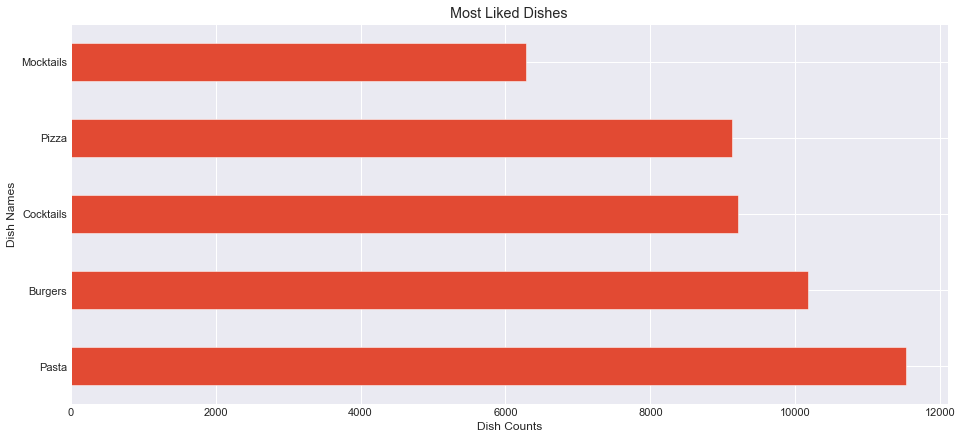

In [302]:
df.dish_liked.value_counts().nlargest().plot(kind = 'barh')
plt.title("Most Liked Dishes")
plt.xlabel("Dish Counts")
plt.ylabel("Dish Names")
plt.show()
# Observation: Top dishes that people enjoy. This graph makes it evident that,
# When compared to the other dishes, the dish Cocktails takes the top spot.
# Observation: Ranking of best dishes Top 3:
# Cocktails, Pasta, Pizza.
#This will give a new upcoming restaurant owner, an Idea on what kinds of food to sell when putting up a restaurant.

In [303]:
# Other codes to do:
# Locate a certain value in a column and clean:
#'Rooftop Ambience'
#df[df.dish_liked == 'Rooftop Ambience']

# clean the value df[df.dish_liked == 'Rooftop Ambience']
#df[df.dish_liked == 'Friendly Staff']

In [304]:
# Locate a certain value in a column and clean:
# 'Rooftop Ambience': Check number of entries:
len(df[df.dish_liked == 'Rooftop Ambience'])

130

In [305]:
# Drop the value: 'Rooftop Ambience' from the column: 'dish_liked'
df.drop(df.index[df['dish_liked'] == 'Rooftop Ambience'], inplace=True)

In [306]:
# Check again to confirm that the value was dropped:
len(df[df.dish_liked == 'Rooftop Ambience'])

0

In [307]:
# Clean the value df[df.dish_liked == 'Rooftop Ambience']
# 'Friendly Staff': Check number of entries:
len(df[df.dish_liked == 'Friendly Staff'])

216

In [308]:
# Drop the value: 'Friendly Staff' from the column: 'dish_liked'
df.drop(df.index[df['dish_liked'] == 'Friendly Staff'], inplace=True)

In [309]:
# Check again to confirm that the value was dropped:
len(df[df.dish_liked == 'Friendly Staff'])

0

***

NUMBER OF RESTAURANT BY LOCATION:

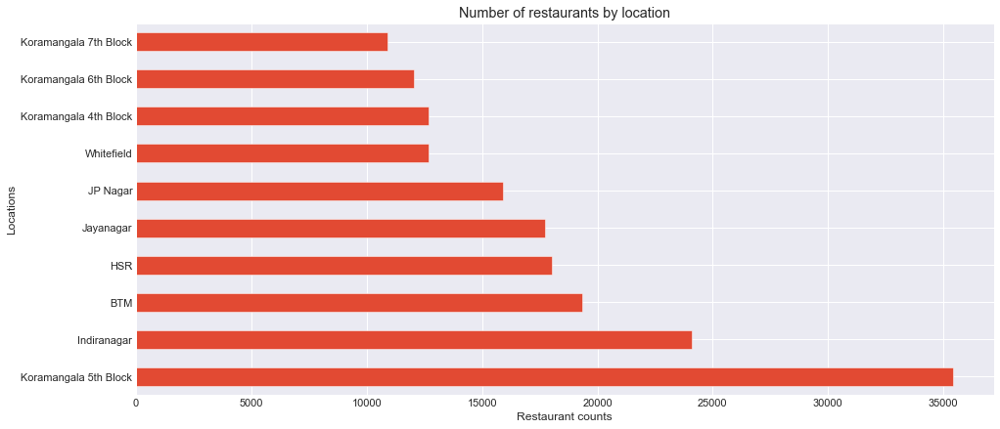

In [310]:
# Analyzing the number of locations with respect to the location

df.location.value_counts().nlargest(10).plot(kind='barh')
plt.title("Number of restaurants by location")
plt.xlabel("Restaurant counts")
plt.ylabel("Locations")
plt.show()

RESTAURANT TYPE:

In [311]:
df['rest_type']=df['rest_type'].map(str) # prevents an error with errounus values
df['rest_type']=df['rest_type'].map(str.strip)

In [312]:
df['rest_type']=df['rest_type'].apply(multivalue_to_list,args=(','))

In [313]:
df=df.explode('rest_type') # Multi values: Seperate entries in this column.
df.head()

,name,address,rate,votes,cost,online_order,book_table,dish_liked,cuisines,location,rest_type,reviews_list,menu_item,type,city
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,North Indian,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,Mughlai,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,Chinese,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Lunch Buffet,North Indian,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Lunch Buffet,Mughlai,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari


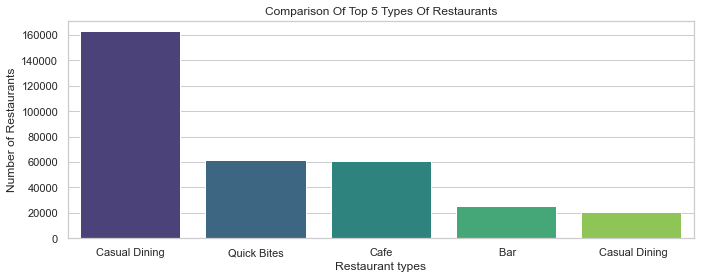

In [316]:
# THIS NEEDS CLEANING!!!!
# Plot Comparison(ranking) Of Top 5 Types Of Restaurants: Inspect/observe values in 'rest_type' column.

# Set size and colors of plot.
plt.figure(figsize = (10,4))
sns.set_theme(style="whitegrid", color_codes=True)

# Create variable for data.
shops=df['rest_type'].value_counts()[:5]

# Plot data.
sns.barplot(shops.index,shops, palette="viridis")

# Set labels of plot
plt.title('Comparison Of Top 5 Types Of Restaurants')
plt.ylabel('Number of Restaurants')
plt.xlabel("Restaurant types")
plt.show()

In [317]:
df['rest_type'].value_counts()
# Observation: Lots of values with white spaces before the first letter.

Casual Dining      162881
Quick Bites         61760
Cafe                60590
 Bar                25063
 Casual Dining      20917
 Cafe               16198
Pub                 16148
Dessert Parlor      15850
Bar                 11798
Delivery             9156
Lounge               6819
 Quick Bites         6709
Fine Dining          6412
Microbrewery         5397
 Dessert Parlor      4602
Bakery               4586
Beverage Shop        4069
 Pub                 3656
 Microbrewery        3241
Takeaway             3219
 Bakery              3176
 Delivery            3138
Food Court           2444
Sweet Shop           2200
 Beverage Shop       1127
 Lounge               909
 Sweet Shop           738
Club                  700
Mess                  632
Kiosk                 445
 Irani Cafee          210
 Food Court           151
Food Truck             72
 Kiosk                 15
Dhaba                   2
Name: rest_type, dtype: int64

In [320]:
# Python String strip() function will remove leading and trailing whitespaces.
df.rest_type = df.rest_type.str.strip()
df['rest_type'].value_counts()

Casual Dining     183798
Cafe               76788
Quick Bites        68469
Bar                36861
Dessert Parlor     20452
Pub                19804
Delivery           12294
Microbrewery        8638
Bakery              7762
Lounge              7728
Fine Dining         6412
Beverage Shop       5196
Takeaway            3219
Sweet Shop          2938
Food Court          2595
Club                 700
Mess                 632
Kiosk                460
Irani Cafee          210
Food Truck            72
Dhaba                  2
Name: rest_type, dtype: int64

In [321]:
#df['rest_type'].duplicated().sum()
df.rest_type.duplicated().sum()

465009

In [322]:
df.drop_duplicates('rest_type', keep='last')

,name,address,rate,votes,cost,online_order,book_table,dish_liked,cuisines,location,rest_type,reviews_list,menu_item,type,city
17647,Punjabi Dhaba,"254, Galaxy Plaza, Next to Kapali Theatre, S.C...",3.6,79,350.0,No,No,Rumali Roti,North Indian,Majestic,Dhaba,"[('Rated 3.0', 'RATED\n An average restaurant...",[],Dine-out,Lavelle Road
20425,S.W.A.T Food Truck,"Location Varies, 17, 5th Main Road, NAL Colony...",3.7,217,450.0,Yes,No,Chips,Fast Food,East Bangalore,Food Truck,"[('Rated 4.0', 'RATED\n Must try becon cheese...",[],Delivery,Old Airport Road
22071,Soda Bottle Opener Wala,"25/4, Opposite Harley Davidson Showroom, Lavel...",4.4,3730,1300.0,Yes,Yes,Kulfi,North Indian,Lavelle Road,Irani Cafee,"[('Rated 5.0', 'RATED\n Adore the food and th...",[],Drinks & nightlife,Residency Road
22598,Glassy,"24-26, 414/80/2, Varthur Hobli, Outer Ring Road",4.2,712,1400.0,No,Yes,Masala Peanuts,Chinese,Bellandur,Club,"[('Rated 3.0', 'RATED\n I would suggest not t...",[],Drinks & nightlife,Sarjapur Road
22651,Chatpatlal Sweets & Snacks,"1339, 60 Feet Road, D Block, AECS Layout, Mara...",4.1,342,200.0,Yes,No,Thali,Desserts,Marathahalli,Sweet Shop,"[('Rated 2.0', ""RATED\n After reading such gr...",[],Delivery,Whitefield
22904,4700BC Popcorn,"Second Floor, Phoenix Market City, Whitefield,...",4.1,55,500.0,No,No,Chocolate Popcorn,Fast Food,Whitefield,Takeaway,"[('Rated 5.0', ""RATED\n This is the best popc...",[],Delivery,Whitefield
22939,Gelato Italiano,"1st Floor, Inorbit Mall, EPIP Zone, Bengalore,...",3.1,39,200.0,Yes,No,Kulfi,Desserts,Whitefield,Kiosk,"[('Rated 4.0', 'RATED\n Wow!! I love deserts....","['Choco Silk Cup', 'Butterscotch Ice Cream', '...",Desserts,Whitefield
23051,Abhiruchi Andhra Mess,"Ferns City, Doddanekkundi, Whitefield, Bangalore",3.1,62,300.0,Yes,No,Chicken Biryani,South Indian,Whitefield,Mess,"[('Rated 1.0', ""RATED\n There was not a singl...",[],Dine-out,Whitefield
23071,Whitefield Bar and Grill - Bengaluru Marriott ...,"Bengaluru Marriott Hotel, 75, 8th Road, EPIP A...",4.1,78,3000.0,No,Yes,Chicken Burger,BBQ,Whitefield,Fine Dining,"[('Rated 2.0', ""RATED\n Let me start by givin...",[],Dine-out,Whitefield
23096,Chai Point,"Lower Ground Floor, Pheonix Market City, White...",3.8,45,150.0,No,No,Ice Tea,Fast Food,Whitefield,Beverage Shop,"[('Rated 4.0', ""RATED\n Visit date - 27/9/201...",[],Dine-out,Whitefield


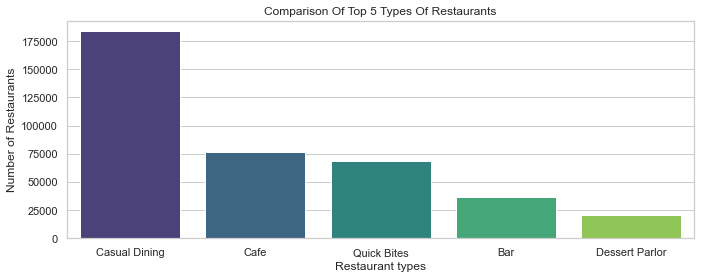

In [324]:
# Check the plot without duplicate:
# Plot Comparison(ranking) Of Top 5 Types Of Restaurants: Inspect/observe values in 'rest_type' column.

# Set size and colors of plot.
plt.figure(figsize = (10,4))
sns.set_theme(style="whitegrid", color_codes=True)

# Create variable for data.
shops=df['rest_type'].value_counts()[:5]

# Plot data.
sns.barplot(shops.index,shops, palette="viridis")

# Set labels of plot
plt.title('Comparison Of Top 5 Types Of Restaurants')
plt.ylabel('Number of Restaurants')
plt.xlabel("Restaurant types")
plt.show()

In [325]:
# Plot types of service in 'Types' column:
# Create Hover Information:
hovertemp = "<b>Service Type: </b> %{x} <br>"
hovertemp += "<b>Number of Restaurants: </b> %{y} <br>"

# Plot histogram chart:
fig = px.histogram(pd.DataFrame({"Types of Services": df['type'].tolist()}),x="Types of Services", color= df['type'].tolist(),
                   title='Service Types', width=980, height=600)
# Use update_traces method for applying this template.
fig.update_traces(hovertemplate=hovertemp)

fig.show()
# Observation: Most of the delivery types offered by restaurants are 'Delivery' and 'Dine-out'.
# Original code for this cell:
# fig = px.histogram (x = df['type'].tolist(), color= df['type'].tolist(), title='Service Types')
#---------------------------------------------------------------------------------------------------------------------
#Other Code To Try:
#sns.countplot(df['type']).set_xticklabels(sns.countplot(df['type']).get_xticklabels(), rotation=90, ha='right')
#fig = plt.gcf()
#fig.set_size_inches(12,12)
#plt.title('Service Types')
#plt.show()

***

CITY:

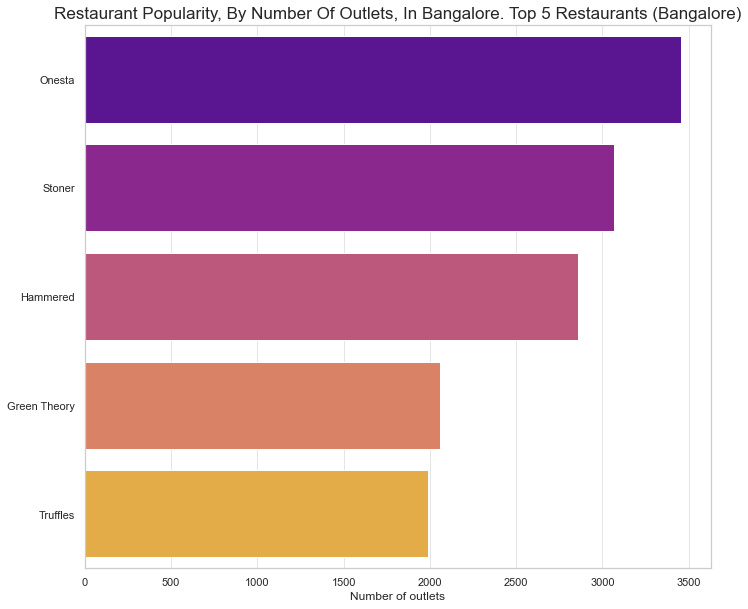

In [327]:
# RESTAURANT POPULARITY, NUMBER OF OUTLETS:
# OBSERVE, THROUGH VISUALIZATION, THE POPULARITY OF RESTAURANTS. WHICH IN THE AREA ARE THE MOST FAMOUS?
# Plot the top 20 restaurant in the data:
plt.figure(figsize=(10,10))
plt.grid(alpha=0.5)
resto = df['name'].value_counts()[ :5]
sns.barplot(x=resto, y=resto.index, palette='plasma')
plt.title('Restaurant Popularity, By Number Of Outlets, In Bangalore. Top 5 Restaurants (Bangalore)',fontsize=17)
plt.xlabel('Number of outlets')
plt.show()

In [329]:
# Final check of cleaned dataset:
df.head()

,name,address,rate,votes,cost,online_order,book_table,dish_liked,cuisines,location,rest_type,reviews_list,menu_item,type,city
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,North Indian,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,Mughlai,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Pasta,Chinese,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Lunch Buffet,North Indian,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
0,Jalsa,"942, 21st Main Road, 2nd Stage, Banashankari, ...",4.1,775,800.0,Yes,Yes,Lunch Buffet,Mughlai,Banashankari,Casual Dining,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari


***
### SAVE CLEANED DATA AND CONVERT TO CSV FILE FOR MODEL BUILDING:

In [330]:
df.to_csv('zomato_cleaned1.csv')